In [304]:
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import requests
import math
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import r2_score

import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Web Scraping

In [5]:
#testing scraping
url = 'https://www.baseball-reference.com/register/player.fcgi?id=witt--001kev' 
response = requests.get(url)
page = response.text
soup = BeautifulSoup(page, "lxml")

In [6]:
#more testing
list1=[]
for tag in soup.find_all("tfoot"):
    for anchor in tag.find_all('tr', class_="mlb"):
        for whatever in tag.find_all('td'):
            list1.append(whatever.text)

In [ ]:
#ok now real work begins from here:

In [5]:
#loading in a csv I made that that has links to all the minor league teams in existance 
all_csvs_2000 = pd.read_csv("All Minor league teams in 2000.csv")
all_csvs_2000.index = all_csvs_2000.Franchise
all_csvs_2000 = all_csvs_2000.drop(columns="Franchise")

In [8]:
all_csvs_2000

,AAA,AA,Adv A,A,Short-Season A,Rookie,Rookie 2
Franchise,,,,,,,
Anaheim Angels (7 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN
Arizona Diamondbacks (8 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...
Atlanta Braves (8 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...
Baltimore Orioles (7 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...
Boston Red Sox (8 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN
Chicago Cubs (7 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN
Chicago White Sox (7 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...
Cincinnati Reds (7 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...
Cleveland Indians (8 teams),https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,https://www.baseball-reference.com/register/te...,NaN


In [9]:
all_csvs_2000.shape

(30, 7)

In [10]:
#practicing grabbing all the URLs from a CSV full of urls
list3 = []
for row in all_csvs_2000.itertuples(index=False):
    for column in row:
        list3.append(column)
        
list3

['https://www.baseball-reference.com/register/team.cgi?id=2f3ed0c1',
 'https://www.baseball-reference.com/register/team.cgi?id=c3a6adb0',
 'https://www.baseball-reference.com/register/team.cgi?id=83babbe7',
 'https://www.baseball-reference.com/register/team.cgi?id=99f366b9',
 'https://www.baseball-reference.com/register/team.cgi?id=3f938703',
 'https://www.baseball-reference.com/register/team.cgi?id=5224dee7',
 nan,
 'https://www.baseball-reference.com/register/team.cgi?id=e623fe21',
 'https://www.baseball-reference.com/register/team.cgi?id=62407a9c',
 'https://www.baseball-reference.com/register/team.cgi?id=ca379232',
 'https://www.baseball-reference.com/register/team.cgi?id=75b47c2a',
 nan,
 'https://www.baseball-reference.com/register/team.cgi?id=2cda3b1b',
 'https://www.baseball-reference.com/register/team.cgi?id=b48f5e57',
 'https://www.baseball-reference.com/register/team.cgi?id=a84d1569',
 'https://www.baseball-reference.com/register/team.cgi?id=8453b7de',
 'https://www.baseball

In [11]:
#practicing scraping
url = all_csvs_2000.iloc[0,0]
response = requests.get(url)
page = response.text
soup = BeautifulSoup(page, "lxml")
soup.prettify

<bound method Tag.prettify of <!DOCTYPE html>
<html class="no-js" data-root="/home/br/www" data-version="klecko-" itemscope="" itemtype="https://schema.org/WebSite" lang="en">
<head>
<meta charset="utf-8"/>
<meta content="ie=edge" http-equiv="x-ua-compatible"/>
<meta content="width=device-width, initial-scale=1.0, maximum-scale=2.0" name="viewport"/>
<link href="https://d2p3bygnnzw9w3.cloudfront.net/req/202004101" rel="dns-prefetch"/>
<!-- no:cookie fast load the css.           -->
<script>function gup(n) {n = n.replace(/[\[]/, '\\[').replace(/[\]]/, '\\]'); var r = new RegExp('[\\?&]'+n+'=([^&#]*)'); var re = r.exec(location.search);   return re === null?'':decodeURIComponent(re[1].replace(/\+/g,' '));}; document.srdev = gup('srdev')</script>
<link crossorigin="" href="https://d2p3bygnnzw9w3.cloudfront.net" rel="preconnect"/>
<link crossorigin="" href="https://d3k2oh6evki4b7.cloudfront.net" rel="preconnect"/>
<style>html,body{margin:0;padding:0;font:14px/1.25 "Helvetica Neue",helvetic

In [12]:
#practing grabbing the names from the team pages
list1=[]
for tag in soup.find_all("tbody"):
    for anchor in tag.find_all('tr'):
        list1.append([anchor.find('a').text,anchor.find('a').get("href")])

In [13]:
list1

[["Evert-Jean 't Hoen", '/register/player.fcgi?id=thoen-001eve'],
 ['Chuck Abbott', '/register/player.fcgi?id=abbott002cha'],
 ['Larry Barnes', '/register/player.fcgi?id=barnes002lar'],
 ['Justin Baughman', '/register/player.fcgi?id=baughm001jus'],
 ['Jamie Burke', '/register/player.fcgi?id=burke-002jam'],
 ['Edgard Clemente', '/register/player.fcgi?id=clemen001edg'],
 ['Steve Decker', '/register/player.fcgi?id=decker001ste'],
 ['Trent Durrington', '/register/player.fcgi?id=durrin001tre'],
 ['David Eckstein', '/register/player.fcgi?id=eckste001dav'],
 ['Bryan Graves', '/register/player.fcgi?id=graves001bry'],
 ['Chris Hatcher', '/register/player.fcgi?id=hatche001chr'],
 ['Bret Hemphill', '/register/player.fcgi?id=hemphi001bre'],
 ['Dwayne Hosey', '/register/player.fcgi?id=hosey-001dwa'],
 ['Keith Johnson', '/register/player.fcgi?id=johnso002kei'],
 ['Brett King', '/register/player.fcgi?id=king--002bre'],
 ['Keith Luuloa', '/register/player.fcgi?id=luuloa001kei'],
 ['Scott Morgan', '/re

In [14]:
#practicing turning a list of lists into a dataframe
df2 = pd.DataFrame(list1)
df2

,0,1
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha
2,Larry Barnes,/register/player.fcgi?id=barnes002lar
3,Justin Baughman,/register/player.fcgi?id=baughm001jus
4,Jamie Burke,/register/player.fcgi?id=burke-002jam
5,Edgard Clemente,/register/player.fcgi?id=clemen001edg
6,Steve Decker,/register/player.fcgi?id=decker001ste
7,Trent Durrington,/register/player.fcgi?id=durrin001tre
8,David Eckstein,/register/player.fcgi?id=eckste001dav
9,Bryan Graves,/register/player.fcgi?id=graves001bry


In [15]:
# function to turn csv of urls into a list of urls to iterate through

def csv_to_urls(csv):
    """
    Arguments: a csv with a bunch of URLs as values
    Returns: A list of URLs
    """
    list_of_urls = []
    new_df = pd.read_csv(csv)
    list1 = new_df.values.tolist()
    list_of_urls = [item for sublist in list1 for item in sublist]

    return list_of_urls
    

In [16]:
#testing the above function
csv_to_urls("All Minor league teams in 2000.csv")

['Anaheim Angels (7 teams)',
 'https://www.baseball-reference.com/register/team.cgi?id=2f3ed0c1',
 'https://www.baseball-reference.com/register/team.cgi?id=c3a6adb0',
 'https://www.baseball-reference.com/register/team.cgi?id=83babbe7',
 'https://www.baseball-reference.com/register/team.cgi?id=99f366b9',
 'https://www.baseball-reference.com/register/team.cgi?id=3f938703',
 'https://www.baseball-reference.com/register/team.cgi?id=5224dee7',
 nan,
 'Arizona Diamondbacks (8 teams)',
 'https://www.baseball-reference.com/register/team.cgi?id=e623fe21',
 'https://www.baseball-reference.com/register/team.cgi?id=62407a9c',
 'https://www.baseball-reference.com/register/team.cgi?id=ca379232',
 'https://www.baseball-reference.com/register/team.cgi?id=75b47c2a',
 nan,
 'https://www.baseball-reference.com/register/team.cgi?id=2cda3b1b',
 'https://www.baseball-reference.com/register/team.cgi?id=b48f5e57',
 'Atlanta Braves (8 teams)',
 'https://www.baseball-reference.com/register/team.cgi?id=a84d1569'

In [17]:
def urls_to_playerdf(list_of_urls):
    """
    Purpose: Takes a list of URLS with minor league baseball team rosters, scrapes each one 
            for player names, grabs the names, and makes a new dataframe with names and url paths that 
            lead to webpages with their stats
    Arguments: a list of URLS
    Returns: Dataframe with player names and URL path
    """
    
    list_of_names = []
    
    #grabbing URLs
    for url in list_of_urls:
        #want to make sure we grab only URLs and not NaNs or other values
        if type(url) == str and url.startswith('https:'):
            response = requests.get(url)
            page = response.text
            soup = BeautifulSoup(page, "lxml")
        
            #once we grab a valid URL, we will scrape the HTML for player names and URLs to their stat pages
            for tag in soup.find_all("tbody"):
                for anchor in tag.find_all('tr'):
                    list_of_names.append([anchor.find('a').text,anchor.find('a').get("href")])
    
    #making the new dataframe with all the names and URLs 
    player_df = pd.DataFrame(list_of_names)
    
    return player_df

In [18]:
#running the two created functions to test them and start building an MVP dataset
urls = csv_to_urls("All Minor league teams in 2000.csv")
hello = urls_to_playerdf(urls)
hello

,0,1
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha
2,Larry Barnes,/register/player.fcgi?id=barnes002lar
3,Justin Baughman,/register/player.fcgi?id=baughm001jus
4,Jamie Burke,/register/player.fcgi?id=burke-002jam
...,...,...
4539,Nom Siriveaw,/register/player.fcgi?id=sirive001nom
4540,Aaron Sisk,/register/player.fcgi?id=sisk--001aar
4541,Buster Small,/register/player.fcgi?id=small-001chr
4542,Jose Umbria,/register/player.fcgi?id=umbria001jos


In [19]:
#some players in 2000 played on multiple minor league teams(very common) so we want to get rid of duplicates
players_2000 = hello.drop_duplicates([0]).reset_index().drop(columns='index')

In [20]:
#yay look the dataframe works
players_2000

,0,1
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha
2,Larry Barnes,/register/player.fcgi?id=barnes002lar
3,Justin Baughman,/register/player.fcgi?id=baughm001jus
4,Jamie Burke,/register/player.fcgi?id=burke-002jam
...,...,...
3411,Ubaldo Ramos,/register/player.fcgi?id=ramos-001uba
3412,Willie Rivera,/register/player.fcgi?id=rivera002wil
3413,Nom Siriveaw,/register/player.fcgi?id=sirive001nom
3414,Aaron Sisk,/register/player.fcgi?id=sisk--001aar


In [21]:
#before we scrape for stats lets add all of our columns now and rename the ones we have:
players_2000['MINORS_G'] = 0
players_2000['MINORS_AB'] = 0
players_2000['MINORS_R'] = 0
players_2000['MINORS_H'] = 0
players_2000['MINORS_HR'] = 0
players_2000['MINORS_RBI'] = 0
players_2000['MINORS_BB'] = 0
players_2000['MINORS_SO'] = 0
players_2000['MINORS_BA'] = 0
players_2000['MINORS_OPS'] = 0
players_2000['MLB_G'] = 0
players_2000['MLB_AB'] = 0
players_2000.rename(columns={"0": "player_name", "1": "url_path"})

,0,1,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,0,0,0,0,0,0,0,0,0,0,0,0
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha,0,0,0,0,0,0,0,0,0,0,0,0
2,Larry Barnes,/register/player.fcgi?id=barnes002lar,0,0,0,0,0,0,0,0,0,0,0,0
3,Justin Baughman,/register/player.fcgi?id=baughm001jus,0,0,0,0,0,0,0,0,0,0,0,0
4,Jamie Burke,/register/player.fcgi?id=burke-002jam,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3411,Ubaldo Ramos,/register/player.fcgi?id=ramos-001uba,0,0,0,0,0,0,0,0,0,0,0,0
3412,Willie Rivera,/register/player.fcgi?id=rivera002wil,0,0,0,0,0,0,0,0,0,0,0,0
3413,Nom Siriveaw,/register/player.fcgi?id=sirive001nom,0,0,0,0,0,0,0,0,0,0,0,0
3414,Aaron Sisk,/register/player.fcgi?id=sisk--001aar,0,0,0,0,0,0,0,0,0,0,0,0


In [22]:
#making the dataframe more legible
players_2000 = players_2000.rename(columns={0:"player_name", 1:"url_path"})

In [23]:
players_2000

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,0,0,0,0,0,0,0,0,0,0,0,0
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha,0,0,0,0,0,0,0,0,0,0,0,0
2,Larry Barnes,/register/player.fcgi?id=barnes002lar,0,0,0,0,0,0,0,0,0,0,0,0
3,Justin Baughman,/register/player.fcgi?id=baughm001jus,0,0,0,0,0,0,0,0,0,0,0,0
4,Jamie Burke,/register/player.fcgi?id=burke-002jam,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3411,Ubaldo Ramos,/register/player.fcgi?id=ramos-001uba,0,0,0,0,0,0,0,0,0,0,0,0
3412,Willie Rivera,/register/player.fcgi?id=rivera002wil,0,0,0,0,0,0,0,0,0,0,0,0
3413,Nom Siriveaw,/register/player.fcgi?id=sirive001nom,0,0,0,0,0,0,0,0,0,0,0,0
3414,Aaron Sisk,/register/player.fcgi?id=sisk--001aar,0,0,0,0,0,0,0,0,0,0,0,0


In [51]:
#testing grabbing stats from each players page. Let's start by scraping one page
url2 = 'https://www.baseball-reference.com' + players_2000.iloc[78,1]
response2 = requests.get(url2)
page2 = response2.text
soup2 = BeautifulSoup(page2, "lxml")

In [25]:
#testing the code to grab total MLB AB and G for a player
for tag in soup2.find_all('tfoot'):
    for tag2 in tag.find_all('tr', class_='mlb'):
        for tag3 in tag2.find_all('td'):
                if tag3.get("data-stat") == 'AB':
                    print(tag3.text)
                    #players_2000['MLB_AB'][0] = tag3.text
                elif tag3.get("data-stat") == 'G':
                    print(tag3.text)
                    #players_2000['MLB_G'][0] = tag3.text
                


68
108


In [26]:
#more testing
for tag in soup2.find_all('tfoot'):
    if tag.find('tr', class_='minors'):
        print(True)
    else:
        print(False)

True


In [55]:
#testing the code to grab total Minor league stats for each player
for tag in soup2.find_all('tfoot'):
    if tag.find('tr', class_='minors'):
        for tag2 in tag.find('tr', class_='minors'):
            if tag2.get("data-stat") == 'AB':
                print(tag2.text)
                #players_2000['MINORS_AB'][2] = tag2.text
            elif tag2.get("data-stat") == 'G':   
                print(tag2.text)
                #players_2000['MINORS_G'][2] = tag2.text
            elif tag2.get("data-stat") == 'R':
                print(tag2.text)
                #players_2000['MINORS_R'][2] = tag2.text
            elif tag2.get("data-stat") == 'H':
                print(tag2.text)
                #players_2000['MINORS_H'][2] = tag2.text
            elif tag2.get("data-stat") == 'HR':
                print(tag2.text)
                #players_2000['MINORS_HR'][2] = tag2.text
            elif tag2.get("data-stat") == 'RBI':
                print(tag2.text)
                #players_2000['MINORS_RBI'][2] = tag2.text
            elif tag2.get("data-stat") == 'BB':
                print(tag2.text)
                #players_2000['MINORS_BB'][2] = tag2.text
            elif tag2.get("data-stat") == 'SO':
                print(tag2.text)
                #players_2000['MINORS_SO'][2] = tag2.text
            elif tag2.get("data-stat") == 'batting_avg':
                print(tag2.text)
                #players_2000['MINORS_BA'][2] = tag2.text
            elif tag2.get("data-stat") == 'onbase_plus_slugging':
                print(tag2.text)
                #players_2000['MINORS_OPS'][2] = tag2.text

1050
4037
592
1060
64
398
309
969
.263
.701


In [56]:
#keeping another copy of the df just incase i break something
empty_player_df = pd.DataFrame(players_2000)

In [104]:
#testing the looping
for index,row in enumerate(players_2000.values.tolist()):
    print(index,row[1])

0 /register/player.fcgi?id=thoen-001eve
1 /register/player.fcgi?id=abbott002cha
2 /register/player.fcgi?id=barnes002lar
3 /register/player.fcgi?id=baughm001jus
4 /register/player.fcgi?id=burke-002jam
5 /register/player.fcgi?id=clemen001edg
6 /register/player.fcgi?id=decker001ste
7 /register/player.fcgi?id=durrin001tre
8 /register/player.fcgi?id=eckste001dav
9 /register/player.fcgi?id=graves001bry
10 /register/player.fcgi?id=hatche001chr
11 /register/player.fcgi?id=hemphi001bre
12 /register/player.fcgi?id=hosey-001dwa
13 /register/player.fcgi?id=johnso002kei
14 /register/player.fcgi?id=king--002bre
15 /register/player.fcgi?id=luuloa001kei
16 /register/player.fcgi?id=morgan001sco
17 /register/player.fcgi?id=murphy001nat
18 /register/player.fcgi?id=stoner001mic
19 /register/player.fcgi?id=stoval001dar
20 /register/player.fcgi?id=tolent001jua
21 /register/player.fcgi?id=wooten003wil
22 /register/player.fcgi?id=zeber-001rya
23 /register/player.fcgi?id=blakel001dar
24 /register/player.fcgi?i

499 /register/player.fcgi?id=bouie-001aar
500 /register/player.fcgi?id=franci002rub
501 /register/player.fcgi?id=gibbs-001mar
502 /register/player.fcgi?id=johnso001nel
503 /register/player.fcgi?id=joyce-004tho
504 /register/player.fcgi?id=martin015wil
505 /register/player.fcgi?id=picker001kel
506 /register/player.fcgi?id=rodrig027jos
507 /register/player.fcgi?id=rogers001oma
508 /register/player.fcgi?id=russel002mic
509 /register/player.fcgi?id=schali001geo
510 /register/player.fcgi?id=sena--001son
511 /register/player.fcgi?id=sorian001jai
512 /register/player.fcgi?id=alcant001isr
513 /register/player.fcgi?id=berry-001sea
514 /register/player.fcgi?id=burkha001mor
515 /register/player.fcgi?id=chambl001jam
516 /register/player.fcgi?id=cheval001vir
517 /register/player.fcgi?id=colema001mic
518 /register/player.fcgi?id=deleon001jor
519 /register/player.fcgi?id=diaz--002jua
520 /register/player.fcgi?id=encarn001ang
521 /register/player.fcgi?id=figga-001mic
522 /register/player.fcgi?id=garci

749 /register/player.fcgi?id=thornt001jan
750 /register/player.fcgi?id=alguac001jos
751 /register/player.fcgi?id=benite001yam
752 /register/player.fcgi?id=brumfi001jac
753 /register/player.fcgi?id=caruso001mic
754 /register/player.fcgi?id=christ001mck
755 /register/player.fcgi?id=fordyc001bro
756 /register/player.fcgi?id=foster004jam
757 /register/player.fcgi?id=gibral001ste
758 /register/player.fcgi?id=gonzal005man
759 /register/player.fcgi?id=hyde--001bra
760 /register/player.fcgi?id=inglin001jef
761 /register/player.fcgi?id=liefer001jef
762 /register/player.fcgi?id=long--001rya
763 /register/player.fcgi?id=lydy--001don
764 /register/player.fcgi?id=moore-007wil
765 /register/player.fcgi?id=myers-001rod
766 /register/player.fcgi?id=norton001gre
767 /register/player.fcgi?id=paul--001jos
768 /register/player.fcgi?id=philli003cha
769 /register/player.fcgi?id=rodrig001liu
770 /register/player.fcgi?id=sandov002dan
771 /register/player.fcgi?id=schmac001bri
772 /register/player.fcgi?id=secod

1248 /register/player.fcgi?id=briggs003wil
1249 /register/player.fcgi?id=clevel001rus
1250 /register/player.fcgi?id=daluz-001cra
1251 /register/player.fcgi?id=freire001ale
1252 /register/player.fcgi?id=lindse001rod
1253 /register/player.fcgi?id=lutz--001man
1254 /register/player.fcgi?id=meran-001jor
1255 /register/player.fcgi?id=mitche001der
1256 /register/player.fcgi?id=munson001eri
1257 /register/player.fcgi?id=rios--001bri
1258 /register/player.fcgi?id=santan001ped
1259 /register/player.fcgi?id=torres002and
1260 /register/player.fcgi?id=ust---001bra
1261 /register/player.fcgi?id=boone-001mat
1262 /register/player.fcgi?id=camilo001jua
1263 /register/player.fcgi?id=daigle001leo
1264 /register/player.fcgi?id=franci001jua
1265 /register/player.fcgi?id=freema001ter
1266 /register/player.fcgi?id=gomez-003ric
1267 /register/player.fcgi?id=hlouse001rob
1268 /register/player.fcgi?id=infant001oma
1269 /register/player.fcgi?id=kropf-001and
1270 /register/player.fcgi?id=logan-001exa
1271 /regis

1748 /register/player.fcgi?id=king--001bre
1749 /register/player.fcgi?id=langs-001ron
1750 /register/player.fcgi?id=martin001can
1751 /register/player.fcgi?id=michae001der
1752 /register/player.fcgi?id=repko-001jas
1753 /register/player.fcgi?id=soto--001sau
1754 /register/player.fcgi?id=thomas004cha
1755 /register/player.fcgi?id=vanbui001rod
1756 /register/player.fcgi?id=victor001sha
1757 /register/player.fcgi?id=wright001nat
1758 /register/player.fcgi?id=abercr001reg
1759 /register/player.fcgi?id=aybar-001wil
1760 /register/player.fcgi?id=cordov001ric
1761 /register/player.fcgi?id=detien001dav
1762 /register/player.fcgi?id=diaz--004jos
1763 /register/player.fcgi?id=escale001jos
1764 /register/player.fcgi?id=garcia018jos
1765 /register/player.fcgi?id=godbol001kei
1766 /register/player.fcgi?id=lipowi001nat
1767 /register/player.fcgi?id=mendoz001adr
1768 /register/player.fcgi?id=nunez-001man
1769 /register/player.fcgi?id=pachec001jul
1770 /register/player.fcgi?id=price-001jar
1771 /regis

2498 /register/player.fcgi?id=duncan001jan
2499 /register/player.fcgi?id=giron-001ale
2500 /register/player.fcgi?id=johnso002jas
2501 /register/player.fcgi?id=merhof001aar
2502 /register/player.fcgi?id=nunez-001ser
2503 /register/player.fcgi?id=salaza001jer
2504 /register/player.fcgi?id=schrei001eri
2505 /register/player.fcgi?id=terrel002jef
2506 /register/player.fcgi?id=valdez001ger
2507 /register/player.fcgi?id=vanite001rob
2508 /register/player.fcgi?id=aceved001car
2509 /register/player.fcgi?id=beverl001sho
2510 /register/player.fcgi?id=byrd--001mar
2511 /register/player.fcgi?id=collaz001jul
2512 /register/player.fcgi?id=deitri001jer
2513 /register/player.fcgi?id=espy--001nat
2514 /register/player.fcgi?id=hannah001leo
2515 /register/player.fcgi?id=hitchc001sam
2516 /register/player.fcgi?id=jacobs002rus
2517 /register/player.fcgi?id=oneill001dan
2518 /register/player.fcgi?id=padill001jor
2519 /register/player.fcgi?id=reyes-001amb
2520 /register/player.fcgi?id=richar002jua
2521 /regis

2998 /register/player.fcgi?id=pena--001pel
2999 /register/player.fcgi?id=richar001mig
3000 /register/player.fcgi?id=rosari001vic
3001 /register/player.fcgi?id=strong001jam
3002 /register/player.fcgi?id=brown-002lar
3003 /register/player.fcgi?id=cadena001ale
3004 /register/player.fcgi?id=chiari001mar
3005 /register/player.fcgi?id=floyd-003dan
3006 /register/player.fcgi?id=gonzal002car
3007 /register/player.fcgi?id=jones-001jar
3008 /register/player.fcgi?id=oliver002lui
3009 /register/player.fcgi?id=olkows001kev
3010 /register/player.fcgi?id=pines-001gre
3011 /register/player.fcgi?id=toledo001edu
3012 /register/player.fcgi?id=warrio001jos
3013 /register/player.fcgi?id=ambros002joh
3014 /register/player.fcgi?id=ametll001jes
3015 /register/player.fcgi?id=benes-001ala
3016 /register/player.fcgi?id=bevins001and
3017 /register/player.fcgi?id=bieser001ste
3018 /register/player.fcgi?id=brunet001jus
3019 /register/player.fcgi?id=clapp-001ric
3020 /register/player.fcgi?id=cole--001vic
3021 /regis

In [58]:
def grab_player_stats(players_dataframe):
    """
    Purpose: Takes a dataframe with player names and URLs to their stats page, scrapes the stats page for MLB 
    and Minor league stats for each player, and then adds the stats to the correct row in the dataframe
    Arguments: Dataframe with player names, URLs to their stats page, and empty rows for stats.
    Returns: Dataframe with all stats rows filled out for every player
    """
    for index,row in enumerate(players_dataframe.values.tolist()):
        
        #grab the url for the player, scrape the HTML and save it in soup
        url = 'https://www.baseball-reference.com' + str(row[1])
        response = requests.get(url)
        page = response.text
        soup = BeautifulSoup(page, "lxml")
        
        #grab all minor league stats
        if players_dataframe['MINORS_G'][index] == 0:
            for tag in soup.find_all('tfoot'):
                if tag.find('tr', class_='minors'):
                    for tag2 in tag.find('tr', class_='minors'):
                        if tag2.get("data-stat") == 'AB':
                            players_dataframe['MINORS_AB'][index] = tag2.text
                        elif tag2.get("data-stat") == 'G':   
                            players_dataframe['MINORS_G'][index] = tag2.text
                        elif tag2.get("data-stat") == 'R':
                            players_dataframe['MINORS_R'][index] = tag2.text
                        elif tag2.get("data-stat") == 'H':
                            players_dataframe['MINORS_H'][index] = tag2.text
                        elif tag2.get("data-stat") == 'HR':
                            players_dataframe['MINORS_HR'][index] = tag2.text
                        elif tag2.get("data-stat") == 'RBI':
                            players_dataframe['MINORS_RBI'][index] = tag2.text
                        elif tag2.get("data-stat") == 'BB':
                            players_dataframe['MINORS_BB'][index] = tag2.text
                        elif tag2.get("data-stat") == 'SO':
                            players_dataframe['MINORS_SO'][index] = tag2.text
                        elif tag2.get("data-stat") == 'batting_avg':
                            players_dataframe['MINORS_BA'][index] = tag2.text
                        elif tag2.get("data-stat") == 'onbase_plus_slugging':
                            players_dataframe['MINORS_OPS'][index] = tag2.text

        #grab all major league stats
        for tag in soup.find_all('tfoot'):
            for tag2 in tag.find_all('tr', class_='mlb'):
                for tag3 in tag2.find_all('td'):
                    if tag3.get("data-stat") == 'AB':
                        players_dataframe['MLB_AB'][index] = tag3.text
                    elif tag3.get("data-stat") == 'G':
                        players_dataframe['MLB_G'][index] = tag3.text
        print(str(index) + " completed!")
        
    return players_dataframe

In [59]:
#running the function above
cool_df = grab_player_stats(players_2000)
cool_df

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs

0 completed!
1 completed!


/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2 completed!
3 completed!
4 completed!
5 completed!
6 completed!
7 completed!
8 completed!
9 completed!
10 completed!
11 completed!
12 completed!
13 completed!
14 completed!
15 completed!
16 completed!
17 completed!
18 completed!
19 completed!
20 completed!
21 completed!
22 completed!
23 completed!
24 completed!
25 completed!
26 completed!
27 completed!
28 completed!
29 completed!
30 completed!
31 completed!
32 completed!
33 completed!
34 completed!
35 completed!
36 completed!
37 completed!
38 completed!
39 completed!
40 completed!
41 completed!
42 completed!
43 completed!
44 completed!
45 completed!
46 completed!
47 completed!
48 completed!
49 completed!
50 completed!
51 completed!
52 completed!
53 completed!
54 completed!
55 completed!
56 completed!
57 completed!
58 completed!
59 completed!
60 completed!
61 completed!
62 completed!
63 completed!
64 completed!
65 completed!
66 completed!
67 completed!
68 completed!
69 completed!
70 completed!
71 completed!
72 completed!
73 completed!


556 completed!
557 completed!
558 completed!
559 completed!
560 completed!
561 completed!
562 completed!
563 completed!
564 completed!
565 completed!
566 completed!
567 completed!
568 completed!
569 completed!
570 completed!
571 completed!
572 completed!
573 completed!
574 completed!
575 completed!
576 completed!
577 completed!
578 completed!
579 completed!
580 completed!
581 completed!
582 completed!
583 completed!
584 completed!
585 completed!
586 completed!
587 completed!
588 completed!
589 completed!
590 completed!
591 completed!
592 completed!
593 completed!
594 completed!
595 completed!
596 completed!
597 completed!
598 completed!
599 completed!
600 completed!
601 completed!
602 completed!
603 completed!
604 completed!
605 completed!
606 completed!
607 completed!
608 completed!
609 completed!
610 completed!
611 completed!
612 completed!
613 completed!
614 completed!
615 completed!
616 completed!
617 completed!
618 completed!
619 completed!
620 completed!
621 completed!
622 comple

1096 completed!
1097 completed!
1098 completed!
1099 completed!
1100 completed!
1101 completed!
1102 completed!
1103 completed!
1104 completed!
1105 completed!
1106 completed!
1107 completed!
1108 completed!
1109 completed!
1110 completed!
1111 completed!
1112 completed!
1113 completed!
1114 completed!
1115 completed!
1116 completed!
1117 completed!
1118 completed!
1119 completed!
1120 completed!
1121 completed!
1122 completed!
1123 completed!
1124 completed!
1125 completed!
1126 completed!
1127 completed!
1128 completed!
1129 completed!
1130 completed!
1131 completed!
1132 completed!
1133 completed!
1134 completed!
1135 completed!
1136 completed!
1137 completed!
1138 completed!
1139 completed!
1140 completed!
1141 completed!
1142 completed!
1143 completed!
1144 completed!
1145 completed!
1146 completed!
1147 completed!
1148 completed!
1149 completed!
1150 completed!
1151 completed!
1152 completed!
1153 completed!
1154 completed!
1155 completed!
1156 completed!
1157 completed!
1158 com

1609 completed!
1610 completed!
1611 completed!
1612 completed!
1613 completed!
1614 completed!
1615 completed!
1616 completed!
1617 completed!
1618 completed!
1619 completed!
1620 completed!
1621 completed!
1622 completed!
1623 completed!
1624 completed!
1625 completed!
1626 completed!
1627 completed!
1628 completed!
1629 completed!
1630 completed!
1631 completed!
1632 completed!
1633 completed!
1634 completed!
1635 completed!
1636 completed!
1637 completed!
1638 completed!
1639 completed!
1640 completed!
1641 completed!
1642 completed!
1643 completed!
1644 completed!
1645 completed!
1646 completed!
1647 completed!
1648 completed!
1649 completed!
1650 completed!
1651 completed!
1652 completed!
1653 completed!
1654 completed!
1655 completed!
1656 completed!
1657 completed!
1658 completed!
1659 completed!
1660 completed!
1661 completed!
1662 completed!
1663 completed!
1664 completed!
1665 completed!
1666 completed!
1667 completed!
1668 completed!
1669 completed!
1670 completed!
1671 com

2122 completed!
2123 completed!
2124 completed!
2125 completed!
2126 completed!
2127 completed!
2128 completed!
2129 completed!
2130 completed!
2131 completed!
2132 completed!
2133 completed!
2134 completed!
2135 completed!
2136 completed!
2137 completed!
2138 completed!
2139 completed!
2140 completed!
2141 completed!
2142 completed!
2143 completed!
2144 completed!
2145 completed!
2146 completed!
2147 completed!
2148 completed!
2149 completed!
2150 completed!
2151 completed!
2152 completed!
2153 completed!
2154 completed!
2155 completed!
2156 completed!
2157 completed!
2158 completed!
2159 completed!
2160 completed!
2161 completed!
2162 completed!
2163 completed!
2164 completed!
2165 completed!
2166 completed!
2167 completed!
2168 completed!
2169 completed!
2170 completed!
2171 completed!
2172 completed!
2173 completed!
2174 completed!
2175 completed!
2176 completed!
2177 completed!
2178 completed!
2179 completed!
2180 completed!
2181 completed!
2182 completed!
2183 completed!
2184 com

2635 completed!
2636 completed!
2637 completed!
2638 completed!
2639 completed!
2640 completed!
2641 completed!
2642 completed!
2643 completed!
2644 completed!
2645 completed!
2646 completed!
2647 completed!
2648 completed!
2649 completed!
2650 completed!
2651 completed!
2652 completed!
2653 completed!
2654 completed!
2655 completed!
2656 completed!
2657 completed!
2658 completed!
2659 completed!
2660 completed!
2661 completed!
2662 completed!
2663 completed!
2664 completed!
2665 completed!
2666 completed!
2667 completed!
2668 completed!
2669 completed!
2670 completed!
2671 completed!
2672 completed!
2673 completed!
2674 completed!
2675 completed!
2676 completed!
2677 completed!
2678 completed!
2679 completed!
2680 completed!
2681 completed!
2682 completed!
2683 completed!
2684 completed!
2685 completed!
2686 completed!
2687 completed!
2688 completed!
2689 completed!
2690 completed!
2691 completed!
2692 completed!
2693 completed!
2694 completed!
2695 completed!
2696 completed!
2697 com

3148 completed!
3149 completed!
3150 completed!
3151 completed!
3152 completed!
3153 completed!
3154 completed!
3155 completed!
3156 completed!
3157 completed!
3158 completed!
3159 completed!
3160 completed!
3161 completed!
3162 completed!
3163 completed!
3164 completed!
3165 completed!
3166 completed!
3167 completed!
3168 completed!
3169 completed!
3170 completed!
3171 completed!
3172 completed!
3173 completed!
3174 completed!
3175 completed!
3176 completed!
3177 completed!
3178 completed!
3179 completed!
3180 completed!
3181 completed!
3182 completed!
3183 completed!
3184 completed!
3185 completed!
3186 completed!
3187 completed!
3188 completed!
3189 completed!
3190 completed!
3191 completed!
3192 completed!
3193 completed!
3194 completed!
3195 completed!
3196 completed!
3197 completed!
3198 completed!
3199 completed!
3200 completed!
3201 completed!
3202 completed!
3203 completed!
3204 completed!
3205 completed!
3206 completed!
3207 completed!
3208 completed!
3209 completed!
3210 com

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,485,1576,180,326,38,176,145,458,.207,.622,0,0
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha,9,24,1,3,0,4,2,9,.125,.359,0,0
2,Larry Barnes,/register/player.fcgi?id=barnes002lar,1087,4018,627,1141,152,720,377,825,.284,.833,46,78
3,Justin Baughman,/register/player.fcgi?id=baughm001jus,685,2516,378,652,19,241,205,413,.259,.660,79,218
4,Jamie Burke,/register/player.fcgi?id=burke-002jam,1255,4352,574,1211,54,541,386,572,.278,.725,191,390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3411,Ubaldo Ramos,/register/player.fcgi?id=ramos-001uba,0,0,0,0,0,0,0,0,0,0,0,0
3412,Willie Rivera,/register/player.fcgi?id=rivera002wil,215,745,91,169,7,65,81,178,.227,.599,0,0
3413,Nom Siriveaw,/register/player.fcgi?id=sirive001nom,15,52,4,6,0,4,5,17,.115,.347,0,0
3414,Aaron Sisk,/register/player.fcgi?id=sisk--001aar,462,1501,211,351,58,232,173,394,.234,.730,0,0


In [60]:
#dropping outliers (players with no stats)
df2 = cool_df[(cool_df['MINORS_G'] != 0) & (cool_df['MINORS_AB'] != 0)]

In [64]:
#saving the data
import pickle
with open('players_2000.pkl', 'wb') as handle:
    pickle.dump(df2, handle, protocol=pickle.HIGHEST_PROTOCOL) 

In [66]:
with open('players_2000.pkl', 'rb') as handle:
    radtest = pickle.load(handle)


# Data Cleaning

*Thoughts so far:*
1. So first of all, I've only grabbed data for minor league players(you can tell this by looking at the MLB AB distribution). This is making it seem like the better you do in the minors the worse you do in the majors. In other words, there are graphs showing negative correlation between Minors HRs and MLB ABs.  What's really happening is players who never make it to the MLB end up playing in the minors for longer and therefore have higher stat volumes. So basically I need to grab more MLB players to even this out.
1. I can also consider doing some feature engineering and making an average statistic like HRS/AB or something to eliminate this notion that the fewer stats you have the better you'll do in the majors

In [84]:
df2.MINORS_BA = pd.to_numeric(df2.MINORS_BA,downcast='float')

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [85]:
df2.MINORS_BA.dtype

dtype('float32')

In [87]:
df2.MINORS_OPS = pd.to_numeric(df2.MINORS_OPS,downcast='float')

In [88]:
df2.MINORS_OPS.dtype

dtype('float32')

In [92]:
df2['MINORS_R_per_AB'] = df2['MINORS_R']/df2['MINORS_AB']

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [93]:
df2

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB,MINORS_R_per_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,485,1576,180,326,38,176,145,458,0.207,0.622,0,0,0.114213
1,Chuck Abbott,/register/player.fcgi?id=abbott002cha,9,24,1,3,0,4,2,9,0.125,0.359,0,0,0.041667
2,Larry Barnes,/register/player.fcgi?id=barnes002lar,1087,4018,627,1141,152,720,377,825,0.284,0.833,46,78,0.156048
3,Justin Baughman,/register/player.fcgi?id=baughm001jus,685,2516,378,652,19,241,205,413,0.259,0.660,79,218,0.150238
4,Jamie Burke,/register/player.fcgi?id=burke-002jam,1255,4352,574,1211,54,541,386,572,0.278,0.725,191,390,0.131893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3410,Miguel Negron,/register/player.fcgi?id=negron001mig,1019,3774,483,994,50,393,343,654,0.263,0.684,0,0,0.127981
3412,Willie Rivera,/register/player.fcgi?id=rivera002wil,215,745,91,169,7,65,81,178,0.227,0.599,0,0,0.122148
3413,Nom Siriveaw,/register/player.fcgi?id=sirive001nom,15,52,4,6,0,4,5,17,0.115,0.347,0,0,0.076923
3414,Aaron Sisk,/register/player.fcgi?id=sisk--001aar,462,1501,211,351,58,232,173,394,0.234,0.730,0,0,0.140573


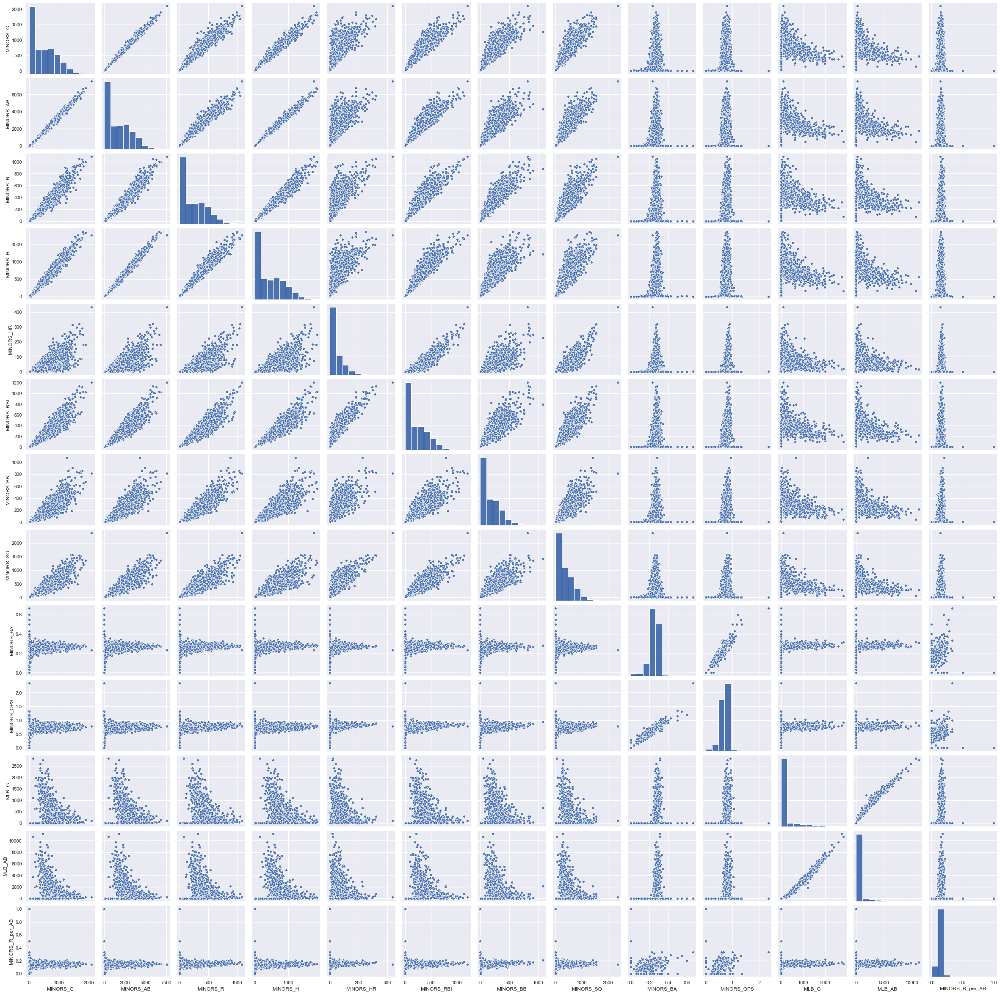

In [94]:
sns.pairplot(df2)

In [107]:
#created a df with only players who have played more than 50 minor league games. Trying to remove outliers
over_50_games = df2[df2['MINORS_G'] > 50]


In [284]:
with open('players_2000_over_50_G.pkl', 'wb') as handle:
    pickle.dump(over_50_games, handle, protocol=pickle.HIGHEST_PROTOCOL) 

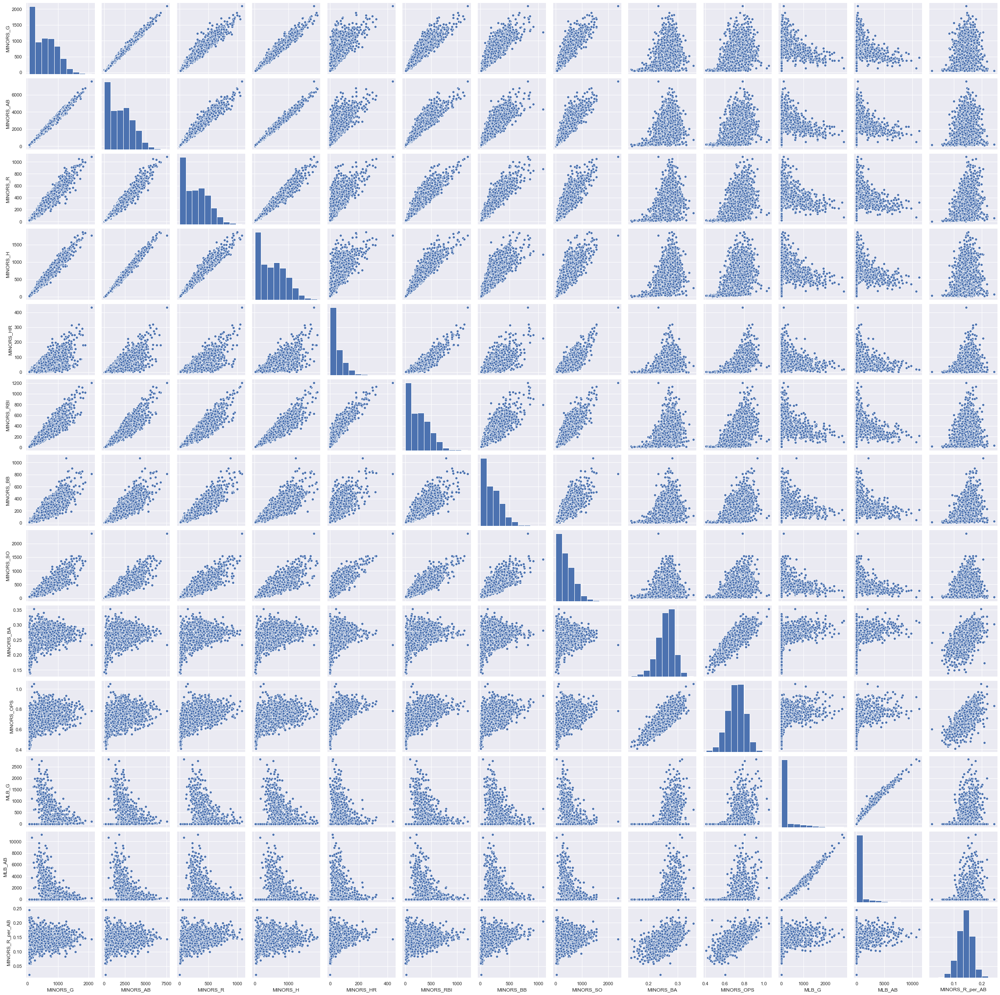

In [108]:
sns.pairplot(over_50_games)

In [113]:
#testing that I pickled appropriately
with open('players_2000_over_50_G.pkl', 'rb') as handle:
    radtest = pickle.load(handle)

# More Web Scraping

In [261]:
#making a list of team abbreviations to make web scraping easier
team_names = ['ARI', 'ATL', 'BAL', 'BOS', 'CHC', 'CHW', 'CIN', 'CLE', 'COL', 'DET', 'HOU', 'KCR', 'ANA', 'LAD', 'FLA', 'MIL', 'MIN', 'NYM', 'NYY', 'OAK', 'PHI', 'PIT', 'SDP', 'SFG', 'SEA', 'STL', 'TBD', 'TEX', 'TOR', 'MON']

In [133]:
#practicing scraping from MLB team pages
url3 = 'https://www.baseball-reference.com/teams/' + team_names[0] + '/2000.shtml'
response3 = requests.get(url3)
page3 = response3.text
soup3 = BeautifulSoup(page3, "lxml")

In [231]:
#practicing scraping from MLB team pages
fake_list = []
name = ''
major_league_url = ''
minor_league_url = ''

for tag in soup3.find_all("tbody", limit=1):
    for i,tag2 in enumerate(tag.find_all('tr', limit=25)):
        for tag3 in tag2.find_all('td', attrs={"data-stat": "player"}):
            name = tag3.find('a').text
            major_league_url = tag3.find('a').get("href")

            url4 = 'https://www.baseball-reference.com' + major_league_url
            response4 = requests.get(url4)
            page4 = response4.text
            soup4 = BeautifulSoup(page4, "lxml")        
    
            for tag in soup4.find_all('div', limit=1, id='inner_nav'):
                for i,tag2 in enumerate(tag.find_all('a', limit=2)):
                    if i == 1:
                        minor_league_url = tag2.get('href')
                        fake_list.append([name,minor_league_url])

Damian Miller /players/m/milleda02.shtml
Greg Colbrunn /players/c/colbrgr01.shtml
Jay Bell /players/b/bellja01.shtml
Tony Womack /players/w/womacto01.shtml
Matt Williams /players/w/willima04.shtml
Luis Gonzalez /players/g/gonzalu01.shtml
Steve Finley /players/f/finlest01.shtml
Danny Bautista /players/b/bautida01.shtml
Kelly Stinnett /players/s/stinnke01.shtml
Travis Lee /players/l/leetr01.shtml
Erubiel Durazo /players/d/durazer01.shtml
Craig Counsell /players/c/counscr01.shtml
Hanley Frias /players/f/friasha01.shtml
Jason Conti /players/c/contija01.shtml
Lenny Harris /players/h/harrile01.shtml
Andy Fox /players/f/foxan01.shtml
Alex Cabrera /players/c/cabreal02.shtml
Danny Klassen /players/k/klassda01.shtml
Bernard Gilkey /players/g/gilkebe01.shtml
Turner Ward /players/w/wardtu01.shtml
David Dellucci /players/d/delluda01.shtml
Rob Ryan /players/r/ryanro02.shtml
Rod Barajas /players/b/barajro01.shtml
Matt Mieske /players/m/mieskma01.shtml


In [262]:
#function to grab all hitters on MLB teams on 2000
def grab_MLB_2000_players():
    
    """
    Purpose: Grab every batter on an MLB roster in the year 2000
    Returns: a datafram with players and the url path to their stats page
    """
    
    player_list = []
    
    #looping through teams and grabbing the HTML for each team page
    for i in range(0,len(team_names)):
        url3 = 'https://www.baseball-reference.com/teams/' + team_names[i] + '/2000.shtml'
        response3 = requests.get(url3)
        page3 = response3.text
        soup3 = BeautifulSoup(page3, "lxml")

        name = ''
        major_league_url = ''
        minor_league_url = ''
        
        #grabbing the URL to each player's regular page, opening that page and grabbing the URL to their full stats
        #page
        for tag in soup3.find_all("tbody", limit=1):
            for i,tag2 in enumerate(tag.find_all('tr', limit=25)):
                for tag3 in tag2.find_all('td', attrs={"data-stat": "player"}):
                    name = tag3.find('a').text
                    major_league_url = tag3.find('a').get("href")

                    url4 = 'https://www.baseball-reference.com' + major_league_url
                    response4 = requests.get(url4)
                    page4 = response4.text
                    soup4 = BeautifulSoup(page4, "lxml")        
                    
                    #grabbing their name and correct url path here
                    for tag in soup4.find_all('div', limit=1, id='inner_nav'):
                        for i,tag2 in enumerate(tag.find_all('a', limit=2)):
                            if i == 1:
                                minor_league_url = tag2.get('href')
                                player_list.append([name,minor_league_url])
                                
    df = pd.DataFrame(player_list)
    return df
    

In [263]:
#running the above function
MLB_players_2000 = grab_MLB_2000_players()

In [264]:
MLB_players_2000

,0,1
0,Damian Miller,/register/player.fcgi?id=miller001dam
1,Greg Colbrunn,/register/player.fcgi?id=colbru001gre
2,Jay Bell,/register/player.fcgi?id=bell--001jay
3,Tony Womack,/register/player.fcgi?id=womack001ant
4,Matt Williams,/register/player.fcgi?id=willia004mat
...,...,...
702,Trace Coquillette,/register/player.fcgi?id=coquil001tra
703,Charlie O'Brien,/register/player.fcgi?id=obrien001cha
704,Yohanny Valera,/register/player.fcgi?id=valera001yoh
705,Talmadge Nunnari,/register/player.fcgi?id=nunnar001tal


In [265]:
#lets add all of our columns now and rename the ones we have:
MLB_players_2000['MINORS_G'] = 0
MLB_players_2000['MINORS_AB'] = 0
MLB_players_2000['MINORS_R'] = 0
MLB_players_2000['MINORS_H'] = 0
MLB_players_2000['MINORS_HR'] = 0
MLB_players_2000['MINORS_RBI'] = 0
MLB_players_2000['MINORS_BB'] = 0
MLB_players_2000['MINORS_SO'] = 0
MLB_players_2000['MINORS_BA'] = 0
MLB_players_2000['MINORS_OPS'] = 0
MLB_players_2000['MLB_G'] = 0
MLB_players_2000['MLB_AB'] = 0
MLB_players_2000 = MLB_players_2000.rename(columns={0:"player_name", 1:"url_path"})
empty_mlb_df = pd.DataFrame(MLB_players_2000)

In [266]:
MLB_players_2000

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Damian Miller,/register/player.fcgi?id=miller001dam,0,0,0,0,0,0,0,0,0,0,0,0
1,Greg Colbrunn,/register/player.fcgi?id=colbru001gre,0,0,0,0,0,0,0,0,0,0,0,0
2,Jay Bell,/register/player.fcgi?id=bell--001jay,0,0,0,0,0,0,0,0,0,0,0,0
3,Tony Womack,/register/player.fcgi?id=womack001ant,0,0,0,0,0,0,0,0,0,0,0,0
4,Matt Williams,/register/player.fcgi?id=willia004mat,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
702,Trace Coquillette,/register/player.fcgi?id=coquil001tra,0,0,0,0,0,0,0,0,0,0,0,0
703,Charlie O'Brien,/register/player.fcgi?id=obrien001cha,0,0,0,0,0,0,0,0,0,0,0,0
704,Yohanny Valera,/register/player.fcgi?id=valera001yoh,0,0,0,0,0,0,0,0,0,0,0,0
705,Talmadge Nunnari,/register/player.fcgi?id=nunnar001tal,0,0,0,0,0,0,0,0,0,0,0,0


In [267]:
#testing scraping player pages for stats
url5 = 'https://www.baseball-reference.com' + MLB_players_2000.iloc[3,1]
response5 = requests.get(url5)
page5 = response5.text
soup5 = BeautifulSoup(page5, "lxml")

for tag in soup5.find_all('tfoot'):
    for tag2 in tag.find_all('tr', class_='mlb'):
        for tag3 in tag2.find_all('td'):
                if tag3.get("data-stat") == 'AB':
                    print(tag3.text)
                    #players_2000['MLB_AB'][0] = tag3.text
                elif tag3.get("data-stat") == 'G':
                    print(tag3.text)
                    #players_2000['MLB_G'][0] = tag3.text

for tag in soup5.find_all('tfoot'):
    if tag.find('tr', class_='minors'):
        for tag2 in tag.find('tr', class_='minors'):
            if tag2.get("data-stat") == 'AB':
                print(tag2.text)
                #players_2000['MINORS_AB'][2] = tag2.text
            elif tag2.get("data-stat") == 'G':   
                print(tag2.text)
                #players_2000['MINORS_G'][2] = tag2.text
            elif tag2.get("data-stat") == 'R':
                print(tag2.text)
                #players_2000['MINORS_R'][2] = tag2.text
            elif tag2.get("data-stat") == 'H':
                print(tag2.text)
                #players_2000['MINORS_H'][2] = tag2.text
            elif tag2.get("data-stat") == 'HR':
                print(tag2.text)
                #players_2000['MINORS_HR'][2] = tag2.text
            elif tag2.get("data-stat") == 'RBI':
                print(tag2.text)
                #players_2000['MINORS_RBI'][2] = tag2.text
            elif tag2.get("data-stat") == 'BB':
                print(tag2.text)
                #players_2000['MINORS_BB'][2] = tag2.text
            elif tag2.get("data-stat") == 'SO':
                print(tag2.text)
                #players_2000['MINORS_SO'][2] = tag2.text
            elif tag2.get("data-stat") == 'batting_avg':
                print(tag2.text)
                #players_2000['MINORS_BA'][2] = tag2.text
            elif tag2.get("data-stat") == 'onbase_plus_slugging':
                print(tag2.text)
                #players_2000['MINORS_OPS'][2] = tag2.text
                

1303
4963
645
2524
360
686
6
165
176
377
.272
.649


In [268]:
#calling my previous webscraping function for my new major league player df
MLB_2000_player_stats = grab_player_stats(MLB_players_2000)
MLB_2000_player_stats

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samir/opt/anaconda3/envs

0 completed!
1 completed!
2 completed!
3 completed!
4 completed!
5 completed!
6 completed!
7 completed!
8 completed!
9 completed!
10 completed!
11 completed!
12 completed!
13 completed!
14 completed!
15 completed!
16 completed!
17 completed!
18 completed!
19 completed!
20 completed!
21 completed!
22 completed!
23 completed!
24 completed!
25 completed!
26 completed!
27 completed!
28 completed!
29 completed!
30 completed!
31 completed!
32 completed!
33 completed!
34 completed!
35 completed!
36 completed!
37 completed!
38 completed!
39 completed!
40 completed!
41 completed!
42 completed!
43 completed!
44 completed!
45 completed!
46 completed!
47 completed!
48 completed!
49 completed!
50 completed!
51 completed!
52 completed!
53 completed!
54 completed!
55 completed!
56 completed!
57 completed!
58 completed!
59 completed!
60 completed!
61 completed!
62 completed!
63 completed!
64 completed!
65 completed!
66 completed!
67 completed!
68 completed!
69 completed!
70 completed!
71 completed!
72

554 completed!
555 completed!
556 completed!
557 completed!
558 completed!
559 completed!
560 completed!
561 completed!
562 completed!
563 completed!
564 completed!
565 completed!
566 completed!
567 completed!
568 completed!
569 completed!
570 completed!
571 completed!
572 completed!
573 completed!
574 completed!
575 completed!
576 completed!
577 completed!
578 completed!
579 completed!
580 completed!
581 completed!
582 completed!
583 completed!
584 completed!
585 completed!
586 completed!
587 completed!
588 completed!
589 completed!
590 completed!
591 completed!
592 completed!
593 completed!
594 completed!
595 completed!
596 completed!
597 completed!
598 completed!
599 completed!
600 completed!
601 completed!
602 completed!
603 completed!
604 completed!
605 completed!
606 completed!
607 completed!
608 completed!
609 completed!
610 completed!
611 completed!
612 completed!
613 completed!
614 completed!
615 completed!
616 completed!
617 completed!
618 completed!
619 completed!
620 comple

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Damian Miller,/register/player.fcgi?id=miller001dam,696,2421,311,667,39,346,232,390,.276,.731,989,3182
1,Greg Colbrunn,/register/player.fcgi?id=colbru001gre,468,1680,214,476,41,250,103,258,.283,.754,992,2769
2,Jay Bell,/register/player.fcgi?id=bell--001jay,598,2112,361,569,58,324,321,377,.269,.791,2063,7398
3,Tony Womack,/register/player.fcgi?id=womack001ant,645,2524,360,686,6,165,176,377,.272,.649,1303,4963
4,Matt Williams,/register/player.fcgi?id=willia004mat,313,1149,190,324,58,205,95,223,.282,.851,1866,7000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
702,Trace Coquillette,/register/player.fcgi?id=coquil001tra,1141,3920,592,1045,98,534,434,855,.267,.777,51,108
703,Charlie O'Brien,/register/player.fcgi?id=obrien001cha,524,1718,285,471,66,297,255,240,.274,.821,800,2232
704,Yohanny Valera,/register/player.fcgi?id=valera001yoh,730,2369,268,537,56,295,149,623,.227,.651,7,10
705,Talmadge Nunnari,/register/player.fcgi?id=nunnar001tal,607,2119,299,616,30,315,290,402,.291,.777,18,5


In [269]:
MLB_2000_player_stats

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Damian Miller,/register/player.fcgi?id=miller001dam,696,2421,311,667,39,346,232,390,.276,.731,989,3182
1,Greg Colbrunn,/register/player.fcgi?id=colbru001gre,468,1680,214,476,41,250,103,258,.283,.754,992,2769
2,Jay Bell,/register/player.fcgi?id=bell--001jay,598,2112,361,569,58,324,321,377,.269,.791,2063,7398
3,Tony Womack,/register/player.fcgi?id=womack001ant,645,2524,360,686,6,165,176,377,.272,.649,1303,4963
4,Matt Williams,/register/player.fcgi?id=willia004mat,313,1149,190,324,58,205,95,223,.282,.851,1866,7000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
702,Trace Coquillette,/register/player.fcgi?id=coquil001tra,1141,3920,592,1045,98,534,434,855,.267,.777,51,108
703,Charlie O'Brien,/register/player.fcgi?id=obrien001cha,524,1718,285,471,66,297,255,240,.274,.821,800,2232
704,Yohanny Valera,/register/player.fcgi?id=valera001yoh,730,2369,268,537,56,295,149,623,.227,.651,7,10
705,Talmadge Nunnari,/register/player.fcgi?id=nunnar001tal,607,2119,299,616,30,315,290,402,.291,.777,18,5


In [273]:
#removing pitchers
MLB_2000_player_stats = MLB_2000_player_stats[MLB_2000_player_stats['MINORS_AB'] > 0]

In [275]:
MLB_2000_player_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 687 entries, 0 to 705
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   player_name  687 non-null    object
 1   url_path     687 non-null    object
 2   MINORS_G     687 non-null    int64 
 3   MINORS_AB    687 non-null    int64 
 4   MINORS_R     687 non-null    int64 
 5   MINORS_H     687 non-null    int64 
 6   MINORS_HR    687 non-null    int64 
 7   MINORS_RBI   687 non-null    int64 
 8   MINORS_BB    687 non-null    int64 
 9   MINORS_SO    687 non-null    int64 
 10  MINORS_BA    687 non-null    object
 11  MINORS_OPS   687 non-null    object
 12  MLB_G        687 non-null    int64 
 13  MLB_AB       687 non-null    int64 
dtypes: int64(10), object(4)
memory usage: 100.5+ KB


In [276]:
#minor data cleaning
MLB_2000_player_stats.MINORS_OPS = pd.to_numeric(MLB_2000_player_stats.MINORS_OPS,downcast='float')

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/pandas/core/generic.py:5303: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [278]:
#minor data cleaning
MLB_2000_player_stats.MINORS_BA = pd.to_numeric(MLB_2000_player_stats.MINORS_BA,downcast='float')

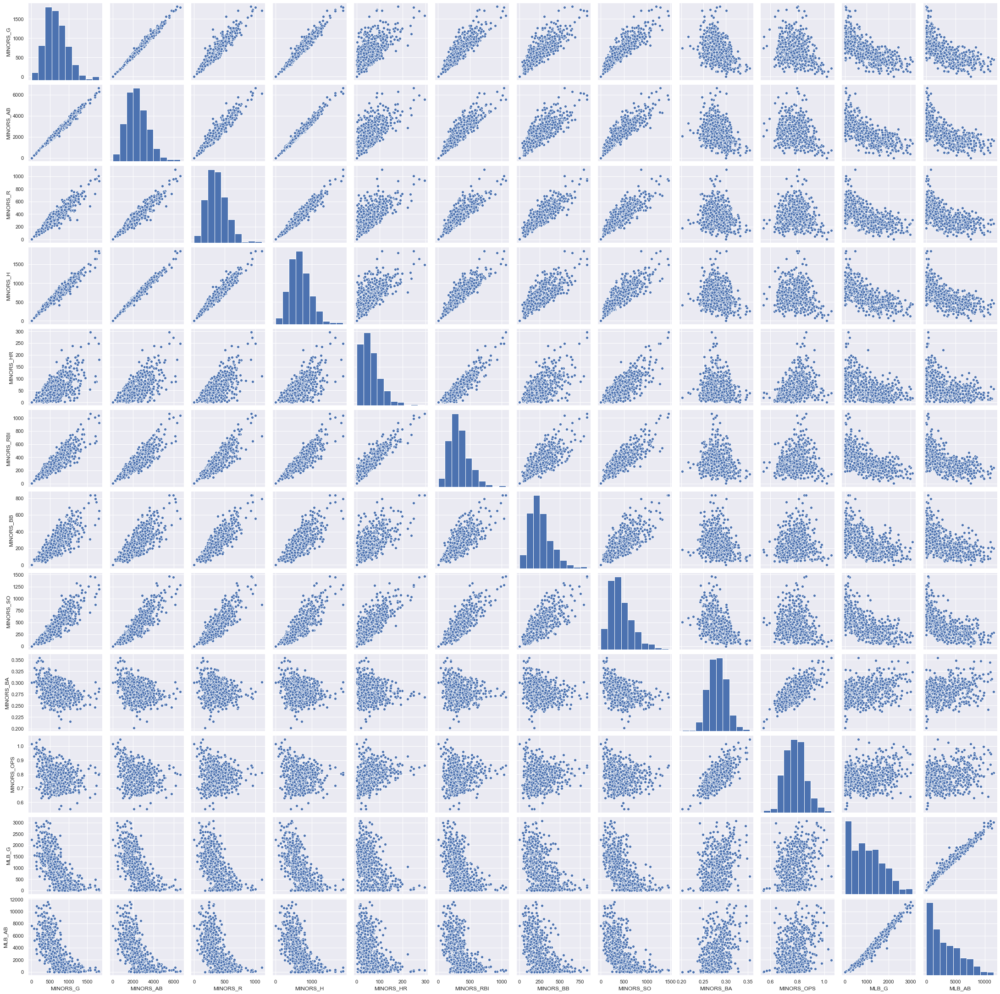

In [279]:
sns.pairplot(MLB_2000_player_stats)

In [282]:
#removing any remaining outliers
MLB_2000_player_stats = MLB_2000_player_stats[MLB_2000_player_stats['MINORS_G'] >  50]

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB
0,Damian Miller,/register/player.fcgi?id=miller001dam,696,2421,311,667,39,346,232,390,0.276,0.731,989,3182
1,Greg Colbrunn,/register/player.fcgi?id=colbru001gre,468,1680,214,476,41,250,103,258,0.283,0.754,992,2769
2,Jay Bell,/register/player.fcgi?id=bell--001jay,598,2112,361,569,58,324,321,377,0.269,0.791,2063,7398
3,Tony Womack,/register/player.fcgi?id=womack001ant,645,2524,360,686,6,165,176,377,0.272,0.649,1303,4963
4,Matt Williams,/register/player.fcgi?id=willia004mat,313,1149,190,324,58,205,95,223,0.282,0.851,1866,7000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701,Tomas de la Rosa,/register/player.fcgi?id=delaro001tom,1182,3994,543,1031,59,473,361,586,0.258,0.687,49,83
702,Trace Coquillette,/register/player.fcgi?id=coquil001tra,1141,3920,592,1045,98,534,434,855,0.267,0.777,51,108
703,Charlie O'Brien,/register/player.fcgi?id=obrien001cha,524,1718,285,471,66,297,255,240,0.274,0.821,800,2232
704,Yohanny Valera,/register/player.fcgi?id=valera001yoh,730,2369,268,537,56,295,149,623,0.227,0.651,7,10


In [285]:
with open('mlb_players_2000.pkl', 'wb') as handle:
    pickle.dump(MLB_2000_player_stats, handle, protocol=pickle.HIGHEST_PROTOCOL) 

In [287]:
with open('players_2000_over_50_G.pkl', 'rb') as handle:
    df2 = pickle.load(handle)

In [289]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2055 entries, 0 to 3414
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   player_name      2055 non-null   object 
 1   url_path         2055 non-null   object 
 2   MINORS_G         2055 non-null   int64  
 3   MINORS_AB        2055 non-null   int64  
 4   MINORS_R         2055 non-null   int64  
 5   MINORS_H         2055 non-null   int64  
 6   MINORS_HR        2055 non-null   int64  
 7   MINORS_RBI       2055 non-null   int64  
 8   MINORS_BB        2055 non-null   int64  
 9   MINORS_SO        2055 non-null   int64  
 10  MINORS_BA        2053 non-null   float32
 11  MINORS_OPS       2053 non-null   float32
 12  MLB_G            2055 non-null   int64  
 13  MLB_AB           2055 non-null   int64  
 14  MINORS_R_per_AB  2055 non-null   float64
dtypes: float32(2), float64(1), int64(10), object(2)
memory usage: 240.8+ KB


In [292]:
#feature engineering: I'm trying to make normalize all the stats by dividing by number of ABs each player had
MLB_2000_player_stats['MINORS_R_per_AB'] = MLB_2000_player_stats['MINORS_R']/MLB_2000_player_stats['MINORS_AB']

/Users/samir/opt/anaconda3/envs/metis/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [293]:
MLB_2000_player_stats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 687 entries, 0 to 705
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   player_name      687 non-null    object 
 1   url_path         687 non-null    object 
 2   MINORS_G         687 non-null    int64  
 3   MINORS_AB        687 non-null    int64  
 4   MINORS_R         687 non-null    int64  
 5   MINORS_H         687 non-null    int64  
 6   MINORS_HR        687 non-null    int64  
 7   MINORS_RBI       687 non-null    int64  
 8   MINORS_BB        687 non-null    int64  
 9   MINORS_SO        687 non-null    int64  
 10  MINORS_BA        686 non-null    float32
 11  MINORS_OPS       686 non-null    float32
 12  MLB_G            687 non-null    int64  
 13  MLB_AB           687 non-null    int64  
 14  MINORS_R_per_AB  687 non-null    float64
dtypes: float32(2), float64(1), int64(10), object(2)
memory usage: 100.5+ KB


In [294]:
#ok now that the two dfs look the same I'm going to concat them together
wow = pd.concat([df2, MLB_2000_player_stats], ignore_index=True)
wow

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB,MINORS_R_per_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,485,1576,180,326,38,176,145,458,0.207,0.622,0,0,0.114213
1,Larry Barnes,/register/player.fcgi?id=barnes002lar,1087,4018,627,1141,152,720,377,825,0.284,0.833,46,78,0.156048
2,Justin Baughman,/register/player.fcgi?id=baughm001jus,685,2516,378,652,19,241,205,413,0.259,0.660,79,218,0.150238
3,Jamie Burke,/register/player.fcgi?id=burke-002jam,1255,4352,574,1211,54,541,386,572,0.278,0.725,191,390,0.131893
4,Edgard Clemente,/register/player.fcgi?id=clemen001edg,973,3586,501,963,125,496,285,875,0.269,0.773,114,257,0.139710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2737,Tomas de la Rosa,/register/player.fcgi?id=delaro001tom,1182,3994,543,1031,59,473,361,586,0.258,0.687,49,83,0.135954
2738,Trace Coquillette,/register/player.fcgi?id=coquil001tra,1141,3920,592,1045,98,534,434,855,0.267,0.777,51,108,0.151020
2739,Charlie O'Brien,/register/player.fcgi?id=obrien001cha,524,1718,285,471,66,297,255,240,0.274,0.821,800,2232,0.165891
2740,Yohanny Valera,/register/player.fcgi?id=valera001yoh,730,2369,268,537,56,295,149,623,0.227,0.651,7,10,0.113128


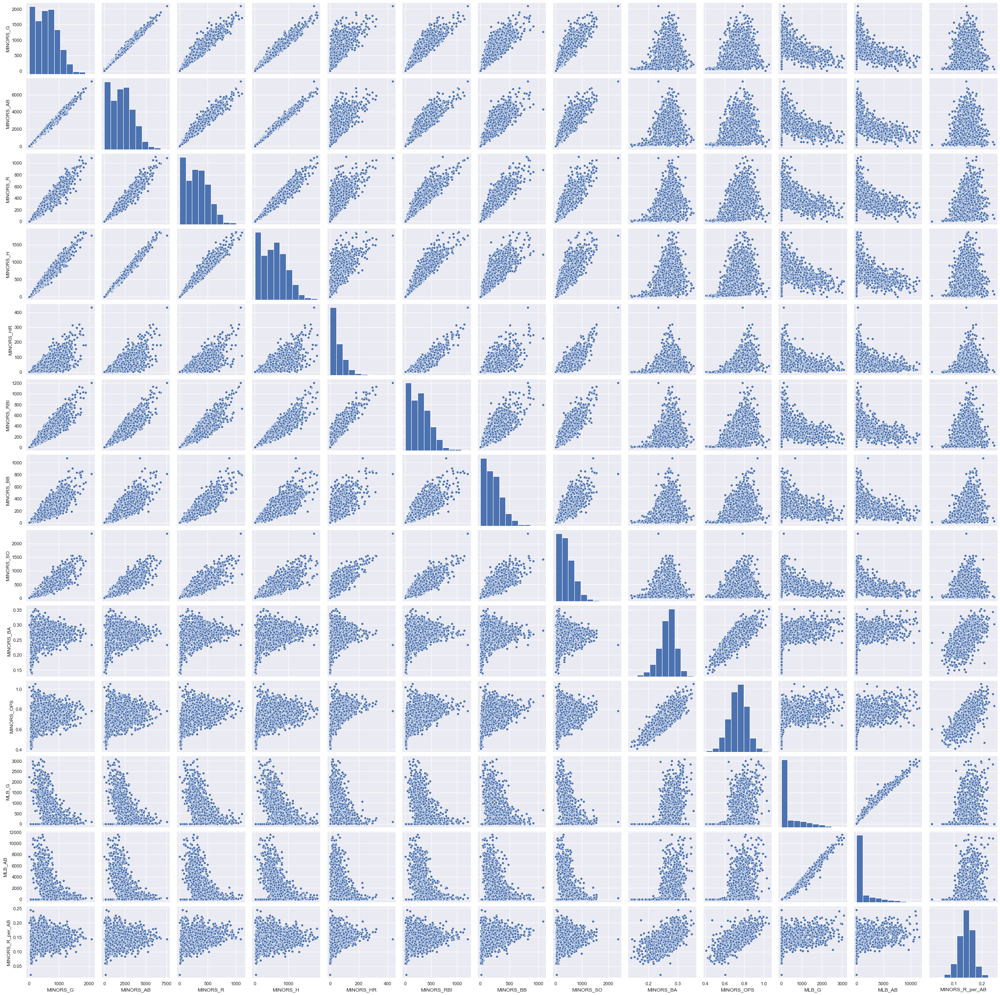

In [295]:
sns.pairplot(wow)

In [301]:
#drop duplicates in case any players were on a minor league team and a major league team in the year 2000
wow.drop_duplicates(['url_path'],inplace=True,ignore_index=True)

In [302]:
wow

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB,MINORS_R_per_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,485,1576,180,326,38,176,145,458,0.207,0.622,0,0,0.114213
1,Larry Barnes,/register/player.fcgi?id=barnes002lar,1087,4018,627,1141,152,720,377,825,0.284,0.833,46,78,0.156048
2,Justin Baughman,/register/player.fcgi?id=baughm001jus,685,2516,378,652,19,241,205,413,0.259,0.660,79,218,0.150238
3,Jamie Burke,/register/player.fcgi?id=burke-002jam,1255,4352,574,1211,54,541,386,572,0.278,0.725,191,390,0.131893
4,Edgard Clemente,/register/player.fcgi?id=clemen001edg,973,3586,501,963,125,496,285,875,0.269,0.773,114,257,0.139710
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2382,Geoff Blum,/register/player.fcgi?id=blum--001geo,602,2103,302,564,28,260,264,302,0.268,0.728,1389,3966,0.143604
2383,Wilton Guerrero,/register/player.fcgi?id=guerre001wil,732,2816,404,877,11,249,174,375,0.311,0.740,678,1678,0.143466
2384,Mike Mordecai,/register/player.fcgi?id=mordec001mic,564,2007,299,538,33,227,212,306,0.268,0.718,793,1362,0.148979
2385,Terry Jones,/register/player.fcgi?id=jones-006ter,720,2782,449,763,4,193,225,482,0.274,0.651,227,530,0.161395


In [303]:
with open('total_players_2000.pkl', 'wb') as handle:
    pickle.dump(wow, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Basic EDA

In [309]:
y, X = patsy.dmatrices('MLB_AB ~ MINORS_R + MINORS_R_per_AB + MINORS_SO + MINORS_BA + MINORS_OPS', data=wow, return_type="dataframe")

# Create your model
model = sm.OLS(y, X)

# Fit your model to your training set
fit = model.fit()

# Print summary statistics of the model's performance
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 MLB_AB   R-squared:                       0.242
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     126.8
Date:                Sat, 11 Apr 2020   Prob (F-statistic):          2.02e-139
Time:                        17:43:39   Log-Likelihood:                -21303.
No. Observations:                2385   AIC:                         4.262e+04
Df Residuals:                    2378   BIC:                         4.266e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -7720.6855    409.189    -18.868      0.000   -8523.089   -6918.282
MINORS_R           -0.5328      1.468     -0.363      0.717      -3.411       2.345
MINORS_H            0.0703      0.766      0.092      0.927      -1.431       1.572
MINORS_R_per_AB  9515.7315   2928.561      3.249      0.001    3772.935    1.53e+04
MINORS_SO          -1.5481      0.345     -4.482      0.000      -2.225      -0.871
MINORS_BA        1.757e+04   3034.318      5.792      0.000    1.16e+04    2.35e+04
MINORS_OPS       4894.4162    928.920      5.269      0.000    3072.839    6715.993
==============================================================================
Omnibus:                      768.735   Durbin-Watson:                   1.293
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2318.079
Skew:                           1.658   Prob(JB):                         0.00
Kurtosis:                       6.511   Cond. No.                     7.65e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.65e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [310]:
#a little bit more featur engineering. Like I said before, we need to normalize these stats because these players
# all played for a different amount of years

wow['MINORS_SO_per_AB'] = wow['MINORS_SO']/wow['MINORS_AB']
wow['MINORS_BB_per_AB'] = wow['MINORS_BB']/wow['MINORS_AB']

In [311]:
wow

,player_name,url_path,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB,MINORS_R_per_AB,MINORS_SO_per_AB,MINORS_BB_per_AB
0,Evert-Jean 't Hoen,/register/player.fcgi?id=thoen-001eve,485,1576,180,326,38,176,145,458,0.207,0.622,0,0,0.114213,0.290609,0.092005
1,Larry Barnes,/register/player.fcgi?id=barnes002lar,1087,4018,627,1141,152,720,377,825,0.284,0.833,46,78,0.156048,0.205326,0.093828
2,Justin Baughman,/register/player.fcgi?id=baughm001jus,685,2516,378,652,19,241,205,413,0.259,0.660,79,218,0.150238,0.164149,0.081479
3,Jamie Burke,/register/player.fcgi?id=burke-002jam,1255,4352,574,1211,54,541,386,572,0.278,0.725,191,390,0.131893,0.131434,0.088695
4,Edgard Clemente,/register/player.fcgi?id=clemen001edg,973,3586,501,963,125,496,285,875,0.269,0.773,114,257,0.139710,0.244004,0.079476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2382,Geoff Blum,/register/player.fcgi?id=blum--001geo,602,2103,302,564,28,260,264,302,0.268,0.728,1389,3966,0.143604,0.143604,0.125535
2383,Wilton Guerrero,/register/player.fcgi?id=guerre001wil,732,2816,404,877,11,249,174,375,0.311,0.740,678,1678,0.143466,0.133168,0.061790
2384,Mike Mordecai,/register/player.fcgi?id=mordec001mic,564,2007,299,538,33,227,212,306,0.268,0.718,793,1362,0.148979,0.152466,0.105630
2385,Terry Jones,/register/player.fcgi?id=jones-006ter,720,2782,449,763,4,193,225,482,0.274,0.651,227,530,0.161395,0.173257,0.080877


In [313]:
y, X = patsy.dmatrices('MLB_AB ~ MINORS_R_per_AB + MINORS_BB_per_AB + MINORS_SO_per_AB + MINORS_BA + MINORS_OPS', data=wow, return_type="dataframe")

# Create your model
model = sm.OLS(y, X)

# Fit your model to your training set
fit = model.fit()

# Print summary statistics of the model's performance
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 MLB_AB   R-squared:                       0.208
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     124.7
Date:                Sat, 11 Apr 2020   Prob (F-statistic):          1.72e-117
Time:                        18:07:54   Log-Likelihood:                -21356.
No. Observations:                2385   AIC:                         4.272e+04
Df Residuals:                    2379   BIC:                         4.276e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept        -4180.4092    581.367     -7.191      0.000   -5320.448   -3040.370
MINORS_R_per_AB   8929.1806   2322.171      3.845      0.000    4375.492    1.35e+04
MINORS_BB_per_AB  1086.7473   1417.077      0.767      0.443   -1692.085    3865.580
MINORS_SO_per_AB -5766.9991    886.027     -6.509      0.000   -7504.465   -4029.533
MINORS_BA         5776.8849   3661.998      1.578      0.115   -1404.152     1.3e+04
MINORS_OPS        4888.0947   1064.493      4.592      0.000    2800.664    6975.525
==============================================================================
Omnibus:                      856.699   Durbin-Watson:                   1.274
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2765.312
Skew:                           1.835   Prob(JB):                         0.00
Kurtosis:                       6.789   Cond. No.                         133.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [351]:
with open('total_players_2000.pkl', 'wb') as handle:
    pickle.dump(wow, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [316]:
wow.corr()

,MINORS_G,MINORS_AB,MINORS_R,MINORS_H,MINORS_HR,MINORS_RBI,MINORS_BB,MINORS_SO,MINORS_BA,MINORS_OPS,MLB_G,MLB_AB,MINORS_R_per_AB,MINORS_SO_per_AB,MINORS_BB_per_AB
MINORS_G,1.000000,0.995002,0.963083,0.982254,0.745742,0.927242,0.879582,0.895975,0.374286,0.368728,0.003944,-0.030851,0.240501,-0.216408,0.020816
MINORS_AB,0.995002,1.000000,0.973507,0.992935,0.750486,0.933376,0.869399,0.890733,0.407969,0.389663,0.029563,-0.005439,0.261999,-0.235495,-0.000840
MINORS_R,0.963083,0.973507,1.000000,0.979258,0.773472,0.928968,0.914834,0.878754,0.469930,0.487272,0.079675,0.043590,0.421675,-0.221583,0.109408
MINORS_H,0.982254,0.992935,0.979258,1.000000,0.749412,0.938725,0.866452,0.859456,0.482699,0.446520,0.065492,0.029701,0.305418,-0.280246,0.007576
MINORS_HR,0.745742,0.750486,0.773472,0.749412,1.000000,0.911215,0.732843,0.838059,0.328416,0.581770,0.054272,0.031113,0.312393,0.068364,0.113644
MINORS_RBI,0.927242,0.933376,0.928968,0.938725,0.911215,1.000000,0.855541,0.886887,0.449665,0.547585,0.068394,0.036315,0.310062,-0.149590,0.065910
MINORS_BB,0.879582,0.869399,0.914834,0.866452,0.732843,0.855541,1.000000,0.828579,0.383505,0.497762,0.072516,0.036455,0.434195,-0.132632,0.392855
MINORS_SO,0.895975,0.890733,0.878754,0.859456,0.838059,0.886887,0.828579,1.000000,0.226629,0.367830,-0.057024,-0.081858,0.245592,0.132208,0.071620
MINORS_BA,0.374286,0.407969,0.469930,0.482699,0.328416,0.449665,0.383505,0.226629,1.000000,0.818659,0.438168,0.420833,0.588589,-0.570416,0.090920
MINORS_OPS,0.368728,0.389663,0.487272,0.446520,0.581770,0.547585,0.497762,0.367830,0.818659,1.000000,0.415118,0.398929,0.713051,-0.201523,0.393787


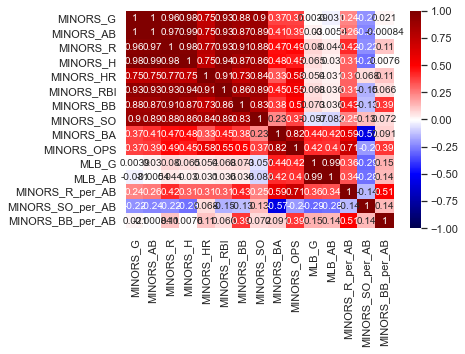

In [317]:
sns.heatmap(wow.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

In [319]:
wow[wow['MLB_AB'] > 486].count()

player_name         713
url_path            713
MINORS_G            713
MINORS_AB           713
MINORS_R            713
MINORS_H            713
MINORS_HR           713
MINORS_RBI          713
MINORS_BB           713
MINORS_SO           713
MINORS_BA           712
MINORS_OPS          712
MLB_G               713
MLB_AB              713
MINORS_R_per_AB     713
MINORS_SO_per_AB    713
MINORS_BB_per_AB    713
dtype: int64

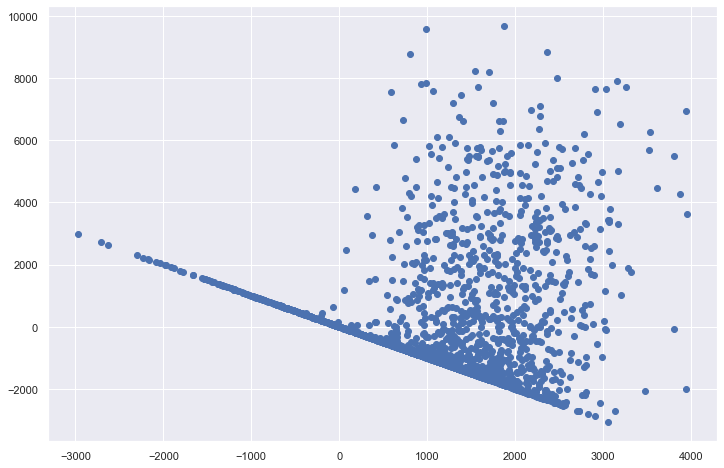

In [320]:
#plotting residuals
plt.figure(figsize=(12,8))
plt.scatter(fit.predict(), fit.resid);

In [321]:
fit.save('first_regression_model.pkl')